# Setup

In [ ]:
!pip install -q transformers flash_attn timm einops peft
# !pip install -q roboflow git+https://github.com/roboflow/supervision.git
from IPython.display import clear_output
clear_output()

In [ ]:
## @title Imports

import io
import os
import re
import json
import torch
import html
import base64
import itertools

import numpy as np
import supervision as sv

from google.colab import userdata
from IPython.core.display import display, HTML
from torch.utils.data import Dataset, DataLoader
from transformers import (
    AdamW,
    AutoModelForCausalLM,
    AutoProcessor,
    get_scheduler
)
from tqdm import tqdm
from typing import List, Dict, Any, Tuple, Generator
from peft import LoraConfig, get_peft_model
from PIL import Image
# from roboflow import Roboflow

In [ ]:
path = '/content/drive/MyDrive/0_Projects/drone-warehouse/'
os.chdir(path)

# Load model

In [ ]:
CHECKPOINT = "microsoft/Florence-2-base-ft"
REVISION = 'refs/pr/6'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = AutoModelForCausalLM.from_pretrained(CHECKPOINT, trust_remote_code=True, revision=REVISION).to(DEVICE)
processor = AutoProcessor.from_pretrained(CHECKPOINT, trust_remote_code=True, revision=REVISION)


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json:   0%|          | 0.00/2.43k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/464M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base-ft:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


# Dataset

In [ ]:
## @title Define `DetectionsDataset` class

class JSONLDataset:
    def __init__(self, jsonl_file_path: str, image_directory_path: str):
        self.jsonl_file_path = jsonl_file_path
        self.image_directory_path = image_directory_path
        self.entries = self._load_entries()

    def _load_entries(self) -> List[Dict[str, Any]]:
        entries = []
        with open(self.jsonl_file_path, 'r') as file:
            for line in file:
                data = json.loads(line)
                entries.append(data)
        return entries

    def __len__(self) -> int:
        return len(self.entries)

    def __getitem__(self, idx: int) -> Tuple[Image.Image, Dict[str, Any]]:
        if idx < 0 or idx >= len(self.entries):
            raise IndexError("Index out of range")

        entry = self.entries[idx]
        image_path = os.path.join(self.image_directory_path, entry['image'])
        try:
            image = Image.open(image_path)
            return (image, entry)
        except FileNotFoundError:
            raise FileNotFoundError(f"Image file {image_path} not found.")


class DetectionDataset(Dataset):
    def __init__(self, jsonl_file_path: str, image_directory_path: str):
        self.dataset = JSONLDataset(jsonl_file_path, image_directory_path)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, data = self.dataset[idx]
        prefix = data['prefix']
        suffix = data['suffix']
        return prefix, suffix, image

# Setup LoRA Florence-2 model

In [18]:


config = LoraConfig(
    r=16,
    lora_alpha=8,
    target_modules=["q_proj", "o_proj", "k_proj", "v_proj", "linear", "Conv2d", "lm_head", "fc2"],
    task_type="CAUSAL_LM",
    lora_dropout=0.05,
    bias="none",
    inference_mode=False,
    use_rslora=True,
    init_lora_weights="gaussian",
    revision=REVISION
)

peft_model = get_peft_model(model, config)
peft_model.print_trainable_parameters()

trainable params: 3,859,856 || all params: 274,663,824 || trainable%: 1.4053


# Initiate `DetectionsDataset` and `DataLoader` for train and validation subsets

In [ ]:
folder = 'ft-bbox-dataset'

BATCH_SIZE = 6
NUM_WORKERS = 0

def collate_fn(batch):
    questions, answers, images = zip(*batch)
    inputs = processor(text=list(questions), images=list(images), return_tensors="pt", padding=True).to(DEVICE)
    return inputs, answers

train_dataset = DetectionDataset(
    jsonl_file_path = f"{folder}/train/annotations.jsonl",
    image_directory_path = f"{folder}/train/"
)
val_dataset = DetectionDataset(
    jsonl_file_path = f"{folder}/val/annotations.jsonl",
    image_directory_path = f"{folder}/val/"
)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, num_workers=NUM_WORKERS, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, num_workers=NUM_WORKERS)

In [ ]:
jsonl_file_path = f"{folder}/train/annotations.jsonl"
json_data = []
with open(jsonl_file_path, 'r') as file:
    for line in file:
        data = json.loads(line)
        json_data.append(data)
len(json_data)

1655

{'image': 'LSCD_1005.jpg', 'prefix': '<OD>', 'suffix': 'box<loc_268><loc_50><loc_1631><loc_550>box<loc_1622><loc_471><loc_2964><loc_971>box<loc_1672><loc_3516><loc_2826><loc_3866>box<loc_322><loc_3204><loc_1547><loc_3579>box<loc_1635><loc_933><loc_2889><loc_1354>box<loc_1620><loc_1341><loc_2879><loc_1735>box<loc_1679><loc_1707><loc_2912><loc_2087>box<loc_1648><loc_2048><loc_2905><loc_2456>box<loc_1694><loc_2438><loc_2941><loc_2830>box<loc_1682><loc_2835><loc_2900><loc_3174>box<loc_1676><loc_3171><loc_2853><loc_3561>box<loc_369><loc_2835><loc_1653><loc_3282>box<loc_392><loc_2461><loc_1700><loc_2905>box<loc_312><loc_2074><loc_1648><loc_2530>box<loc_230><loc_508><loc_1553><loc_921>box<loc_305><loc_905><loc_1620><loc_1330>box<loc_335><loc_1315><loc_1630><loc_1712>box<loc_343><loc_1702><loc_1633><loc_2110>box<loc_1631><loc_150><loc_2322><loc_508>'}
(4032, 3024)


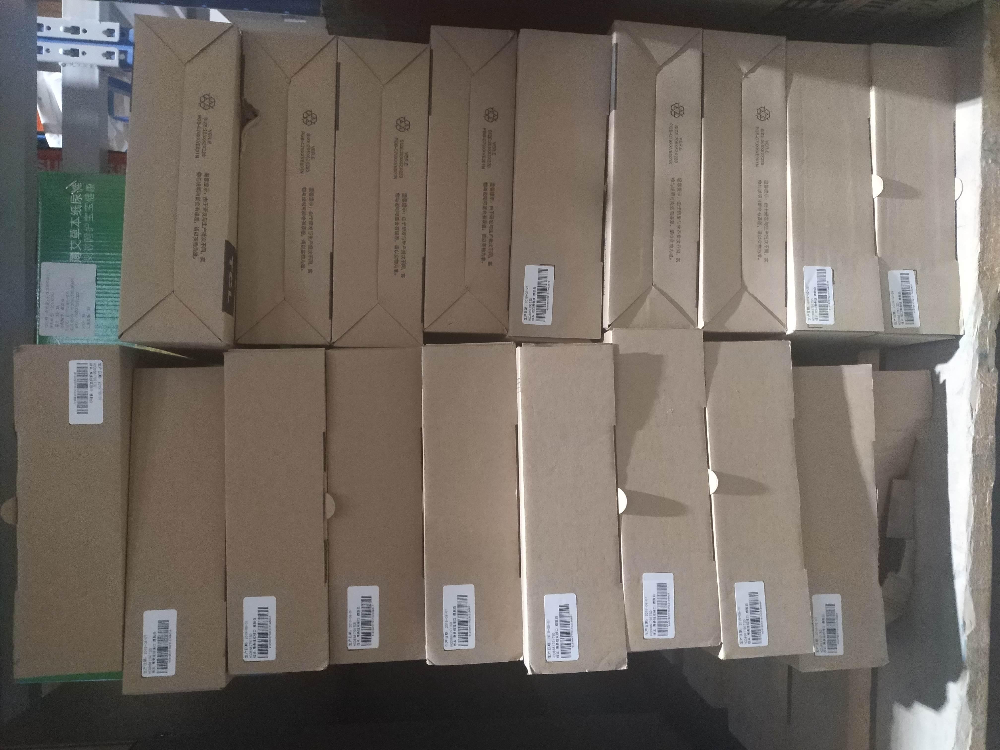

In [ ]:
n = 0
print(json_data[n])
image_directory_path = f"{folder}/train/"
image_name = json_data[n]['image']
image_path = os.path.join(image_directory_path, image_name)
image = Image.open(image_path)
print(image.size)
image

# Run inference with pre-trained Florence-2 model on validation dataset

In [19]:


def render_inline(image: Image.Image, resize=(128, 128)):
    """Convert image into inline html."""
    image.resize(resize)
    with io.BytesIO() as buffer:
        image.save(buffer, format='jpeg')
        image_b64 = str(base64.b64encode(buffer.getvalue()), "utf-8")
        return f"data:image/jpeg;base64,{image_b64}"


def render_example(image: Image.Image, response):
    try:
        detections = sv.Detections.from_lmm(sv.LMM.FLORENCE_2, response, resolution_wh=image.size)
        image = sv.BoundingBoxAnnotator(color_lookup=sv.ColorLookup.INDEX).annotate(image.copy(), detections)
        image = sv.LabelAnnotator(color_lookup=sv.ColorLookup.INDEX).annotate(image, detections)
    except:
        print('failed to redner model response')
    return f"""
<div style="display: inline-flex; align-items: center; justify-content: center;">
    <img style="width:256px; height:256px;" src="{render_inline(image, resize=(128, 128))}" />
    <p style="width:512px; margin:10px; font-size:small;">{html.escape(json.dumps(response))}</p>
</div>
"""


def render_inference_results(model, dataset: DetectionDataset, count: int):
    html_out = ""
    count = min(count, len(dataset))
    for i in range(count):
        image, data = dataset.dataset[i]
        prefix = data['prefix']
        suffix = data['suffix']
        inputs = processor(text=prefix, images=image, return_tensors="pt").to(DEVICE)
        generated_ids = model.generate(
            input_ids=inputs["input_ids"],
            pixel_values=inputs["pixel_values"],
            max_new_tokens=1024,
            num_beams=3
        )
        generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
        answer = processor.post_process_generation(generated_text, task='<OD>', image_size=image.size)
        html_out += render_example(image, answer)

    display(HTML(html_out))




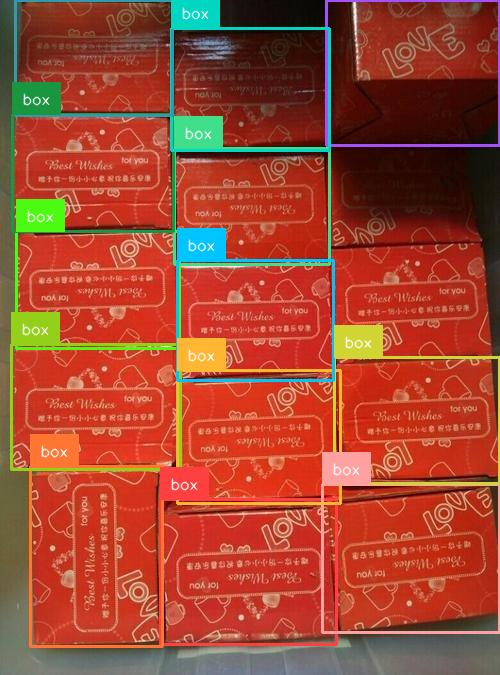
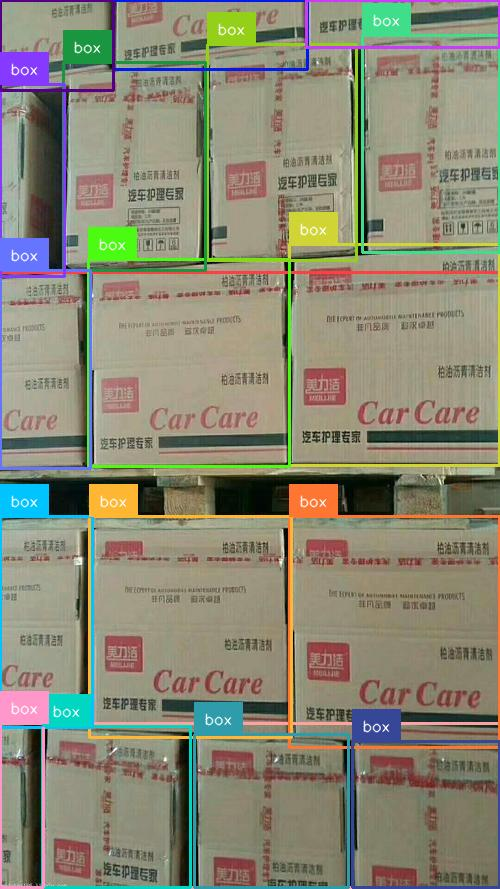
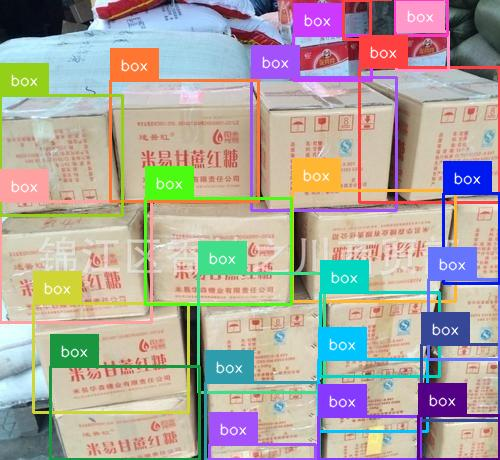
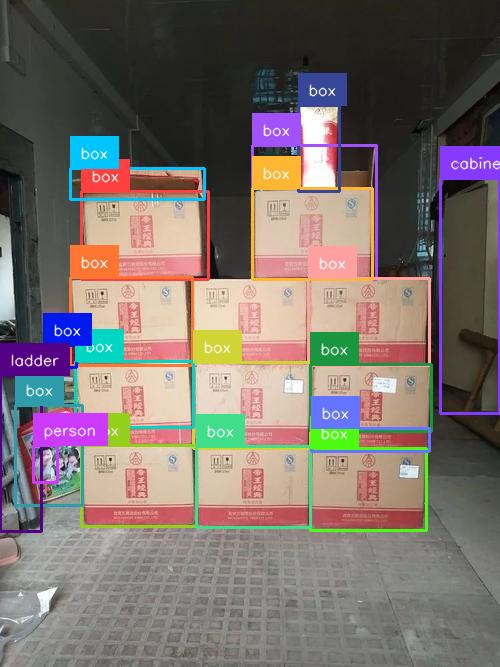
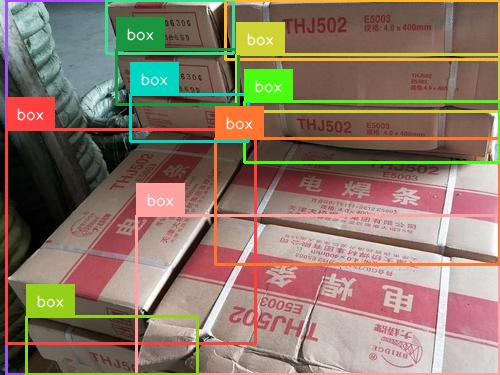
...
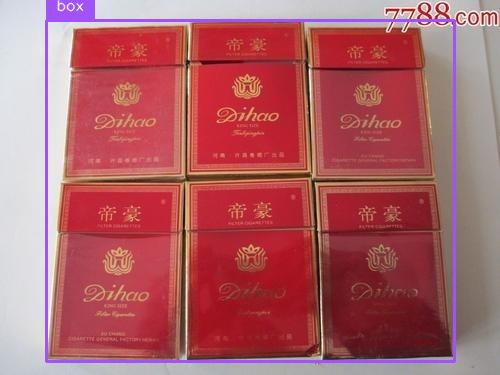
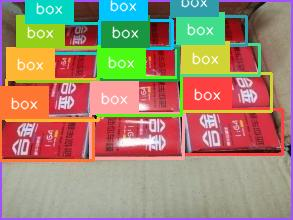
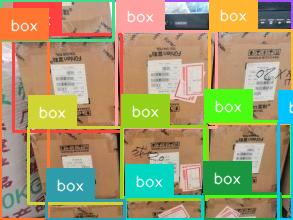
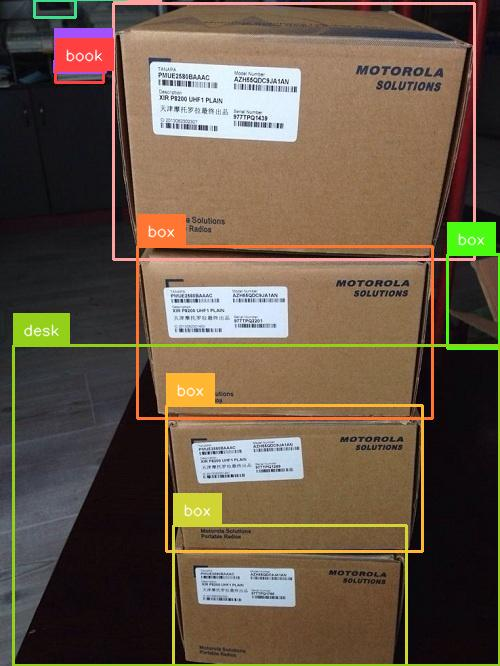
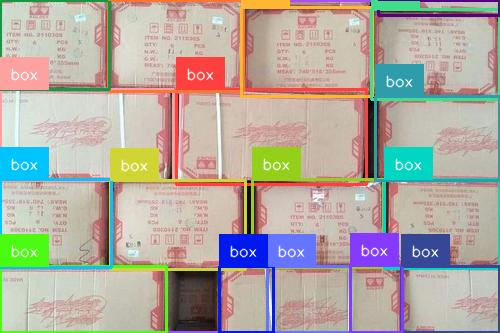

In [23]:
render_inference_results(peft_model, val_dataset, 50)